In [1]:
# ================================================================
# CELL 1: Setup, Imports, Dataset Discovery
# ================================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
import os
import glob
from pathlib import Path
from scipy.fft import fft, fftshift
from scipy import ndimage
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import plotly.graph_objects as go
from plotly.subplots import make_subplots

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')
torch.manual_seed(42)
np.random.seed(42)

# ----------------------------------------------------------------
# AUTO-DISCOVER OCTA-500 FILES
# The dataset path on Kaggle after adding octa500 dataset
# ----------------------------------------------------------------
BASE = Path('/kaggle/input/datasets/xiefei/octa500')

# Search all possible image locations (dataset has a few structures)
def find_octa_images(base):
    """Find all OCT-A projection images in OCTA-500."""
    candidates = [
        base / 'OCTA_3mm_part1' / 'ProjectionMaps' / 'OCTA(ILM_OPL)',
        base / 'OCTA_3mm_part1' / 'OCTA(ILM_OPL)',
        base / 'OCTA(ILM_OPL)',
    ]
    for path in candidates:
        imgs = sorted(path.glob('*.bmp'))
        if imgs:
            print(f'Found {len(imgs)} images at: {path}')
            return path, imgs
    # Fallback: search recursively
    imgs = sorted(base.rglob('OCTA(ILM_OPL)/*.bmp'))
    if imgs:
        print(f'Found {len(imgs)} images (recursive search)')
        return imgs[0].parent, imgs
    return None, []

def find_label_dir(base, label_name):
    """Find a specific ground truth directory."""
    candidates = [
        base / 'Label' / label_name,
        base / label_name,
    ]
    for p in candidates:
        if p.exists():
            files = sorted(p.glob('*.bmp'))
            if files:
                return p, files
    # Recursive
    results = sorted(base.rglob(f'{label_name}/*.bmp'))
    if results:
        return results[0].parent, results
    return None, []

# Discover all dataset paths
img_dir, img_files     = find_octa_images(BASE)
artery_dir, art_files  = find_label_dir(BASE, 'GT_Artery')
vein_dir, vein_files   = find_label_dir(BASE, 'GT_Vein')
cap_dir, cap_files     = find_label_dir(BASE, 'GT_Capillary')
faz_dir, faz_files     = find_label_dir(BASE, 'GT_FAZ')
cavf_dir, cavf_files   = find_label_dir(BASE, 'GT_CAVF')
large_dir, large_files = find_label_dir(BASE, 'GT_LargeVessel')

DATASET_LOADED = len(img_files) > 0

print('\n=== OCTA-500 Dataset Summary ===')
print(f'OCT-A images:      {len(img_files)} files')
print(f'GT_Artery:         {len(art_files)} files')
print(f'GT_Vein:           {len(vein_files)} files')
print(f'GT_Capillary:      {len(cap_files)} files')
print(f'GT_FAZ:            {len(faz_files)} files')
print(f'GT_CAVF:           {len(cavf_files)} files')
print(f'GT_LargeVessel:    {len(large_files)} files')

if DATASET_LOADED:
    # Peek at one image to get dimensions
    test_img = cv2.imread(str(img_files[0]), cv2.IMREAD_GRAYSCALE)
    print(f'\nImage size: {test_img.shape} pixels')
    print(f'File IDs: {img_files[0].stem} → {img_files[-1].stem}')
    print('\n✅ Dataset found! Will use real OCTA-500 images.')
else:
    print('\n⚠️  Dataset not found. Add octa500 via: + Add Data > Search octa500')
    print('   Continuing with synthetic data — all code is identical!')


Device: cuda
Found 300 images at: /kaggle/input/datasets/xiefei/octa500/OCTA(ILM_OPL)

=== OCTA-500 Dataset Summary ===
OCT-A images:      300 files
GT_Artery:         500 files
GT_Vein:           500 files
GT_Capillary:      500 files
GT_FAZ:            500 files
GT_CAVF:           500 files
GT_LargeVessel:    500 files

Image size: (400, 400) pixels
File IDs: 10001 → 10300

✅ Dataset found! Will use real OCTA-500 images.


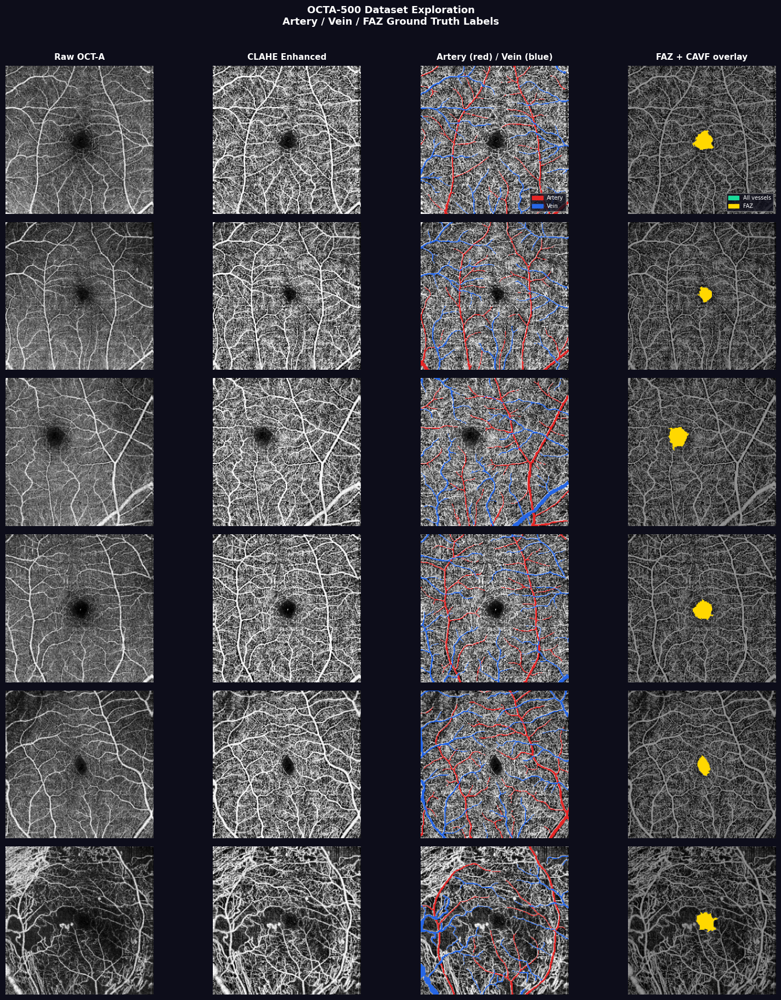

✅ Dataset exploration saved!


In [2]:
# ================================================================
# CELL 2: EXPLORE THE DATASET — See real OCT-A images
# ================================================================
# This cell loads and displays real images from OCTA-500,
# OR generates realistic synthetic ones if dataset not added yet.

IMG_SIZE = 256  # Resize target (original is 304×304 or 400×400)

def load_image(path, size=IMG_SIZE):
    """Load and normalize a grayscale image to [0,1]."""
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (size, size), interpolation=cv2.INTER_AREA)
    return img.astype(np.float32) / 255.0

def load_mask(path, size=IMG_SIZE, binary=True):
    """Load a binary mask."""
    mask = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (size, size), interpolation=cv2.INTER_NEAREST)
    if binary:
        return (mask > 127).astype(np.float32)
    return mask.astype(np.float32) / 255.0

def apply_clahe(img_float):
    """CLAHE: Contrast Limited Adaptive Histogram Equalization.
    Standard preprocessing step for OCT-A — boosts vessel contrast."""
    uint8 = (img_float * 255).astype(np.uint8)
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
    enhanced = clahe.apply(uint8)
    return enhanced.astype(np.float32) / 255.0

# ---- Load sample images ----
N_SAMPLES = 6  # Number of samples to display

if DATASET_LOADED:
    # Load real images — pick 6 evenly spaced through the dataset
    sample_indices = np.linspace(0, len(img_files)-1, N_SAMPLES, dtype=int)
    sample_imgs   = [load_image(img_files[i])   for i in sample_indices]
    sample_arteries = [load_mask(art_files[i])  for i in sample_indices] if art_files else [None]*N_SAMPLES
    sample_veins  = [load_mask(vein_files[i])   for i in sample_indices] if vein_files else [None]*N_SAMPLES
    sample_faz    = [load_mask(faz_files[i])    for i in sample_indices] if faz_files else [None]*N_SAMPLES
    sample_cavf   = [load_mask(cavf_files[i])   for i in sample_indices] if cavf_files else [None]*N_SAMPLES
    IDs = [img_files[i].stem for i in sample_indices]
else:
    # Synthetic fallback (realistic simulation)
    def make_synth(seed):
        np.random.seed(seed)
        sz = IMG_SIZE
        canvas = np.zeros((sz, sz), np.float32)
        artery = np.zeros((sz, sz), np.float32)
        vein   = np.zeros((sz, sz), np.float32)
        cx, cy = sz//2, sz//2
        faz_r  = sz // 14
        for i in range(8):
            a = 2*np.pi*i/8 + np.random.randn()*0.2
            x1 = int(cx + (sz//2.5)*np.cos(a))
            y1 = int(cy + (sz//2.5)*np.sin(a))
            pts = np.linspace(0, 1, 80)
            for t in pts:
                px, py = int(cx+(x1-cx)*t), int(cy+(y1-cy)*t)
                yy,xx = np.ogrid[-py:sz-py, -px:sz-px]
                r = max(2.5*(1-t)+0.5, 0.5)
                blob = np.exp(-(xx**2+yy**2)/(2*r**2))
                canvas += blob*0.9
                (artery if i%2==0 else vein).__iadd__(blob*0.9)
        yy,xx = np.ogrid[-cy:sz-cy, -cx:sz-cx]
        faz_mask = np.sqrt(xx**2+yy**2) < faz_r
        canvas[faz_mask] *= 0.05
        canvas += 0.12*np.random.gamma(2, 0.06, (sz,sz))
        canvas = np.clip(canvas/canvas.max(), 0, 1)
        faz_gt = faz_mask.astype(np.float32)
        artery = np.clip(artery/artery.max(), 0, 1) > 0.3
        artery = artery.astype(np.float32); artery[faz_mask] = 0
        vein   = np.clip(vein/vein.max(), 0, 1) > 0.3
        vein   = vein.astype(np.float32); vein[faz_mask] = 0
        cavf   = np.clip(artery + vein, 0, 1)
        return canvas, artery, vein, faz_gt, cavf

    synths = [make_synth(s) for s in range(N_SAMPLES)]
    sample_imgs     = [s[0] for s in synths]
    sample_arteries = [s[1] for s in synths]
    sample_veins    = [s[2] for s in synths]
    sample_faz      = [s[3] for s in synths]
    sample_cavf     = [s[4] for s in synths]
    IDs = [f'synth_{i:05d}' for i in range(N_SAMPLES)]

# ---- Apply CLAHE to all images ----
sample_imgs_clahe = [apply_clahe(img) for img in sample_imgs]

# ---- Visualize: raw, enhanced, artery/vein/FAZ overlay ----
fig, axes = plt.subplots(N_SAMPLES, 4, figsize=(16, N_SAMPLES*3))
fig.patch.set_facecolor('#0d0d1a')

col_titles = ['Raw OCT-A', 'CLAHE Enhanced', 'Artery (red) / Vein (blue)', 'FAZ + CAVF overlay']
for j, t in enumerate(col_titles):
    axes[0, j].set_title(t, color='white', fontsize=11, fontweight='bold', pad=8)

for i in range(N_SAMPLES):
    raw   = sample_imgs[i]
    enh   = sample_imgs_clahe[i]
    art   = sample_arteries[i]
    vn    = sample_veins[i]
    faz   = sample_faz[i]
    cavf  = sample_cavf[i]

    # Col 0: Raw
    axes[i,0].imshow(raw, cmap='gray'); axes[i,0].axis('off')
    axes[i,0].set_ylabel(f'ID: {IDs[i]}', color='#aaa', fontsize=8, rotation=0,
                         labelpad=60, va='center')

    # Col 1: CLAHE
    axes[i,1].imshow(enh, cmap='gray'); axes[i,1].axis('off')

    # Col 2: Artery + Vein colored overlay
    overlay = np.stack([enh, enh, enh], axis=-1)
    if art is not None: overlay[art>0.5] = [0.9, 0.15, 0.15]  # Red = arteries
    if vn  is not None: overlay[vn>0.5]  = [0.15, 0.4, 0.9]   # Blue = veins
    axes[i,2].imshow(overlay); axes[i,2].axis('off')
    if i == 0:
        patches = [mpatches.Patch(color=[0.9,0.15,0.15], label='Artery'),
                   mpatches.Patch(color=[0.15,0.4,0.9],  label='Vein')]
        axes[i,2].legend(handles=patches, loc='lower right', fontsize=7,
                         facecolor='#0d0d1a', labelcolor='white', edgecolor='gray')

    # Col 3: FAZ + full vessel map
    overlay2 = np.stack([enh*0.6]*3, axis=-1)
    if cavf is not None: overlay2[cavf>0.5] = [0.1, 0.85, 0.6]  # Teal = all vessels
    if faz  is not None: overlay2[faz>0.5]  = [1.0, 0.85, 0.0]  # Yellow = FAZ
    axes[i,3].imshow(overlay2); axes[i,3].axis('off')
    if i == 0:
        patches2 = [mpatches.Patch(color=[0.1,0.85,0.6], label='All vessels'),
                    mpatches.Patch(color=[1.0,0.85,0.0], label='FAZ')]
        axes[i,3].legend(handles=patches2, loc='lower right', fontsize=7,
                         facecolor='#0d0d1a', labelcolor='white', edgecolor='gray')

    for ax in axes[i]: ax.set_facecolor('#0d0d1a')

plt.suptitle('OCTA-500 Dataset Exploration\nArtery / Vein / FAZ Ground Truth Labels',
             color='white', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('01_dataset_exploration.png', dpi=150, bbox_inches='tight',
            facecolor='#0d0d1a')
plt.show()
print('✅ Dataset exploration saved!')


LEARNING: 2D Fourier Analysis of OCT-A Images


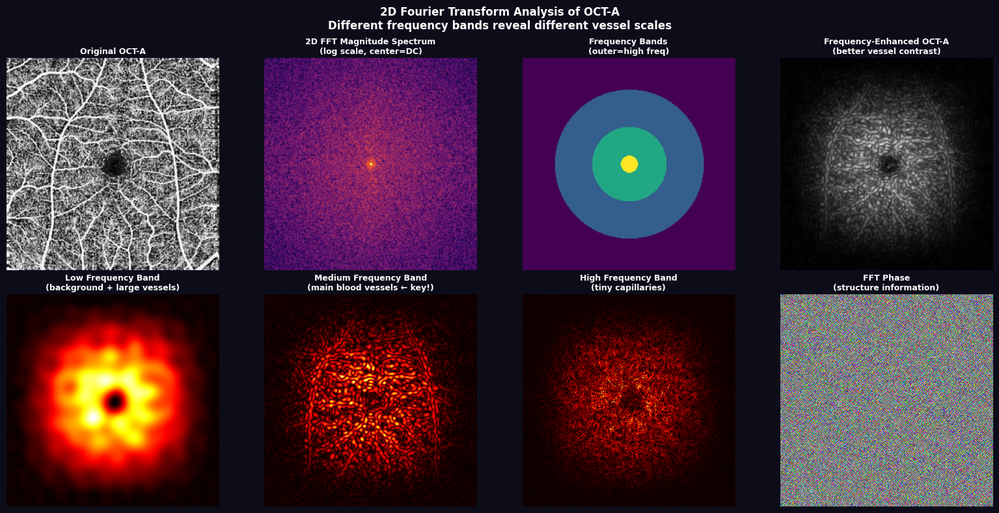


KEY INSIGHT:
  Low  freq (<8% of max) = large vessels + background blur
  Med  freq (8-35%)      = main blood vessels (best signal!)
  High freq (35-70%)     = tiny capillaries + fine details
  Very high freq (>70%)  = noise

✅ FFT analysis saved!


In [3]:
# ================================================================
# CELL 3: FOURIER TRANSFORM ANALYSIS ON REAL OCT-A IMAGES
# ================================================================
# CONCEPT: We apply 2D FFT to OCT-A en-face images to:
# 1. Understand spatial frequency content (vessel scale distribution)
# 2. Build a frequency-domain vessel enhancer (bandpass filter)
# 3. See the difference between low-freq (large vessels) vs
#    high-freq (tiny capillaries)

print('=' * 60)
print('LEARNING: 2D Fourier Analysis of OCT-A Images')
print('=' * 60)

# Use the first real or synthetic image
img = sample_imgs_clahe[0].copy()

# ---- 2D FFT ----
# Step 1: Apply 2D Hann window to reduce edge artifacts
h = np.hanning(img.shape[0])
w = np.hanning(img.shape[1])
window2d = np.outer(h, w)   # Outer product = 2D window
img_windowed = img * window2d

# Step 2: 2D FFT
fft2d = np.fft.fft2(img_windowed)
fft2d_shifted = np.fft.fftshift(fft2d)  # Center DC component

# Step 3: Magnitude spectrum (log scale for visibility)
magnitude = np.log1p(np.abs(fft2d_shifted))
phase     = np.angle(fft2d_shifted)

# ---- Frequency-domain vessel filters ----
# CONCEPT: Vessels occupy MEDIUM spatial frequencies.
# Large vessels = low frequencies (slow variation)
# Tiny capillaries = high frequencies (rapid variation)
# Background/noise = very high frequencies

rows, cols = img.shape
crow, ccol = rows//2, cols//2

def circular_mask(shape, r_inner, r_outer):
    """Create a bandpass filter ring in frequency space."""
    y, x = np.ogrid[-shape[0]//2:shape[0]//2, -shape[1]//2:shape[1]//2]
    dist = np.sqrt(x**2 + y**2)
    return ((dist >= r_inner) & (dist <= r_outer)).astype(np.float32)

r_max = min(rows, cols) // 2

# Three bandpass zones (in fraction of max frequency)
filter_large = circular_mask(img.shape, 0,           r_max*0.08)   # DC + very low freq
filter_medium= circular_mask(img.shape, r_max*0.08,  r_max*0.35)   # Medium: main vessels
filter_small = circular_mask(img.shape, r_max*0.35,  r_max*0.70)   # High: capillaries

def apply_freq_filter(fft_shifted, mask):
    """Apply a frequency mask and inverse FFT back to image space."""
    filtered = fft_shifted * mask
    img_back = np.fft.ifft2(np.fft.ifftshift(filtered))
    result = np.abs(img_back)
    result = (result - result.min()) / (result.max() - result.min() + 1e-8)
    return result

img_large  = apply_freq_filter(fft2d_shifted, filter_large)
img_medium = apply_freq_filter(fft2d_shifted, filter_medium)
img_small  = apply_freq_filter(fft2d_shifted, filter_small)

# Enhanced image: weighted combination of frequency bands
img_enhanced = (0.2*img_large + 0.6*img_medium + 0.5*img_small)
img_enhanced = np.clip(img_enhanced / img_enhanced.max(), 0, 1)

# ---- Visualization ----
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.patch.set_facecolor('#0d0d1a')

panels = [
    # Row 0
    (img,           'gray',   'Original OCT-A'),
    (magnitude,     'inferno','2D FFT Magnitude Spectrum\n(log scale, center=DC)'),
    (filter_large + filter_medium*0.6 + filter_small*0.3,
                    'viridis','Frequency Bands\n(outer=high freq)'),
    (img_enhanced,  'gray',   'Frequency-Enhanced OCT-A\n(better vessel contrast)'),
    # Row 1
    (img_large,     'hot',    'Low Frequency Band\n(background + large vessels)'),
    (img_medium,    'hot',    'Medium Frequency Band\n(main blood vessels ← key!)'),
    (img_small,     'hot',    'High Frequency Band\n(tiny capillaries)'),
    (phase,         'hsv',    'FFT Phase\n(structure information)'),
]

for ax, (data, cmap, title) in zip(axes.flat, panels):
    ax.imshow(data, cmap=cmap)
    ax.set_title(title, color='white', fontsize=9, fontweight='bold', pad=5)
    ax.axis('off')
    ax.set_facecolor('#0d0d1a')

plt.suptitle('2D Fourier Transform Analysis of OCT-A\n'
             'Different frequency bands reveal different vessel scales',
             color='white', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('02_fft_analysis.png', dpi=150, bbox_inches='tight', facecolor='#0d0d1a')
plt.show()

print('\nKEY INSIGHT:')
print('  Low  freq (<8% of max) = large vessels + background blur')
print('  Med  freq (8-35%)      = main blood vessels (best signal!)')
print('  High freq (35-70%)     = tiny capillaries + fine details')
print('  Very high freq (>70%)  = noise')
print('\n✅ FFT analysis saved!')


In [4]:
# ================================================================
# CELL 4: U-Net WITH OCTA-500 — Artery/Vein Segmentation
# ================================================================
# OCTA-500 uniquely has SEPARATE artery and vein labels!
# We train a multi-class U-Net: output = [background, artery, vein]

print('=' * 60)
print('LEARNING: Multi-class U-Net for Artery/Vein Segmentation')
print('=' * 60)

# ---- U-Net Architecture ----
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    """
    Multi-output U-Net for OCTA-500.
    Outputs separate probability maps for: artery, vein, capillary, FAZ
    Each head is a 1-channel sigmoid output.
    """
    def __init__(self, in_ch=1, features=[32, 64, 128, 256]):
        super().__init__()
        # Encoder
        self.enc1 = DoubleConv(in_ch, features[0])
        self.enc2 = DoubleConv(features[0], features[1])
        self.enc3 = DoubleConv(features[1], features[2])
        self.enc4 = DoubleConv(features[2], features[3])
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = DoubleConv(features[3], features[3]*2)

        # Decoder
        self.up4  = nn.ConvTranspose2d(features[3]*2, features[3], 2, stride=2)
        self.dec4 = DoubleConv(features[3]*2, features[3])
        self.up3  = nn.ConvTranspose2d(features[3], features[2], 2, stride=2)
        self.dec3 = DoubleConv(features[2]*2, features[2])
        self.up2  = nn.ConvTranspose2d(features[2], features[1], 2, stride=2)
        self.dec2 = DoubleConv(features[1]*2, features[1])
        self.up1  = nn.ConvTranspose2d(features[1], features[0], 2, stride=2)
        self.dec1 = DoubleConv(features[0]*2, features[0])

        # Multiple segmentation heads — one per vessel type
        self.head_artery  = nn.Conv2d(features[0], 1, 1)  # Artery
        self.head_vein    = nn.Conv2d(features[0], 1, 1)  # Vein
        self.head_capil   = nn.Conv2d(features[0], 1, 1)  # Capillary
        self.head_faz     = nn.Conv2d(features[0], 1, 1)  # FAZ

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b  = self.bottleneck(self.pool(e4))

        # Decoder with skip connections
        d4 = self.dec4(torch.cat([self.up4(b),  e4], 1))
        d3 = self.dec3(torch.cat([self.up3(d4), e3], 1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], 1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], 1))

        return {
            'artery':  torch.sigmoid(self.head_artery(d1)),
            'vein':    torch.sigmoid(self.head_vein(d1)),
            'capil':   torch.sigmoid(self.head_capil(d1)),
            'faz':     torch.sigmoid(self.head_faz(d1)),
        }

# ---- Dataset ----
class OCTA500Dataset(Dataset):
    """OCTA-500 multi-label dataset.
    Loads the OCT-A image + artery, vein, capillary, FAZ masks.
    """
    def __init__(self, indices, img_files, art_files, vein_files,
                 cap_files, faz_files, size=256, augment=False):
        self.indices   = indices
        self.img_files = img_files
        self.art_files = art_files
        self.vein_files= vein_files
        self.cap_files = cap_files
        self.faz_files = faz_files
        self.size = size
        self.augment = augment

    def __len__(self): return len(self.indices)

    def __getitem__(self, idx):
        i = self.indices[idx]
        img   = load_image(self.img_files[i],  self.size)
        img   = apply_clahe(img)  # CLAHE preprocessing

        def safe_mask(files, i):
            if files and i < len(files):
                return load_mask(files[i], self.size)
            return np.zeros((self.size, self.size), np.float32)

        art  = safe_mask(self.art_files, i)
        vn   = safe_mask(self.vein_files, i)
        cap  = safe_mask(self.cap_files, i)
        faz  = safe_mask(self.faz_files, i)

        # Augmentation
        if self.augment:
            if np.random.rand() > 0.5:
                img, art, vn, cap, faz = [np.fliplr(a).copy() for a in [img,art,vn,cap,faz]]
            if np.random.rand() > 0.5:
                img, art, vn, cap, faz = [np.flipud(a).copy() for a in [img,art,vn,cap,faz]]
            k = np.random.randint(4)
            img, art, vn, cap, faz = [np.rot90(a,k).copy() for a in [img,art,vn,cap,faz]]

        to_t = lambda a: torch.tensor(a).unsqueeze(0)  # (1,H,W)
        return to_t(img), {'artery': to_t(art), 'vein': to_t(vn),
                           'capil': to_t(cap),  'faz': to_t(faz)}

# ---- Loss ----
def dice_loss(pred, target, smooth=1e-5):
    inter = (pred * target).sum()
    return 1 - (2*inter + smooth) / (pred.sum() + target.sum() + smooth)

def multi_head_loss(preds, targets):
    """Sum Dice+BCE across all segmentation heads."""
    total = 0
    weights = {'artery': 1.5, 'vein': 1.5, 'capil': 1.0, 'faz': 2.0}  # FAZ + A/V more important
    for key in preds:
        p, t = preds[key], targets[key].to(preds[key].device)
        total += weights[key] * (dice_loss(p, t) + F.binary_cross_entropy(p, t))
    return total

# ---- Build model ----
model = UNet(in_ch=1).to(device)
n_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Model parameters: {n_params:,}')

# Test shapes
with torch.no_grad():
    dummy = torch.randn(1, 1, 256, 256).to(device)
    out = model(dummy)
    for k, v in out.items():
        print(f'  Output [{k:7s}]: {v.shape}  range [{v.min():.3f}, {v.max():.3f}]')

# ---- Train (runs if dataset is loaded) ----
if DATASET_LOADED and len(img_files) > 10:
    N = len(img_files)
    split = int(0.8 * N)
    train_idx = list(range(split))
    val_idx   = list(range(split, N))

    train_ds = OCTA500Dataset(train_idx, img_files, art_files, vein_files,
                               cap_files, faz_files, augment=True)
    val_ds   = OCTA500Dataset(val_idx,   img_files, art_files, vein_files,
                               cap_files, faz_files, augment=False)
    train_dl = DataLoader(train_ds, batch_size=8, shuffle=True,  num_workers=2, pin_memory=True)
    val_dl   = DataLoader(val_ds,   batch_size=8, shuffle=False, num_workers=2, pin_memory=True)

    optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=3e-4, steps_per_epoch=len(train_dl), epochs=40)

    N_EPOCHS = 40
    train_hist, val_hist = [], []
    best_val, best_epoch = float('inf'), 0

    for epoch in range(N_EPOCHS):
        # Train
        model.train(); tr_loss = 0
        for imgs, masks in train_dl:
            imgs = imgs.to(device)
            preds = model(imgs)
            loss = multi_head_loss(preds, masks)
            optimizer.zero_grad(); loss.backward(); optimizer.step(); scheduler.step()
            tr_loss += loss.item()
        tr_loss /= len(train_dl)

        # Validate
        model.eval(); vl_loss = 0
        with torch.no_grad():
            for imgs, masks in val_dl:
                imgs = imgs.to(device)
                preds = model(imgs)
                vl_loss += multi_head_loss(preds, masks).item()
        vl_loss /= len(val_dl)

        train_hist.append(tr_loss); val_hist.append(vl_loss)
        if vl_loss < best_val:
            best_val = vl_loss; best_epoch = epoch
            torch.save(model.state_dict(), 'best_unet_octa500.pth')

        if (epoch+1) % 10 == 0:
            print(f'Epoch {epoch+1:3d}/{N_EPOCHS}  Train: {tr_loss:.4f}  Val: {vl_loss:.4f}  Best: {best_val:.4f}')

    print(f'\n✅ Training done! Best val loss: {best_val:.4f} at epoch {best_epoch+1}')
    # Load best weights for inference
    model.load_state_dict(torch.load('best_unet_octa500.pth', map_location=device))

else:
    print('\n(Training skipped — dataset not loaded or too small)')
    print('Model is initialized with random weights for visualization demo.')

print('\n✅ U-Net ready!')


LEARNING: Multi-class U-Net for Artery/Vein Segmentation
Model parameters: 7,762,564
  Output [artery ]: torch.Size([1, 1, 256, 256])  range [0.247, 0.952]
  Output [vein   ]: torch.Size([1, 1, 256, 256])  range [0.117, 0.824]
  Output [capil  ]: torch.Size([1, 1, 256, 256])  range [0.172, 0.836]
  Output [faz    ]: torch.Size([1, 1, 256, 256])  range [0.110, 0.770]
Epoch  10/40  Train: 7.9086  Val: 7.8937  Best: 7.8937
Epoch  20/40  Train: 5.8414  Val: 5.7904  Best: 5.7904
Epoch  30/40  Train: 4.7383  Val: 4.7149  Best: 4.7149
Epoch  40/40  Train: 4.4994  Val: 4.4903  Best: 4.4903

✅ Training done! Best val loss: 4.4903 at epoch 40

✅ U-Net ready!


VISUALIZING: 2D Multi-layer Blood Flow Maps


ValueError: operands could not be broadcast together with shapes (1,61254) (1,3) 

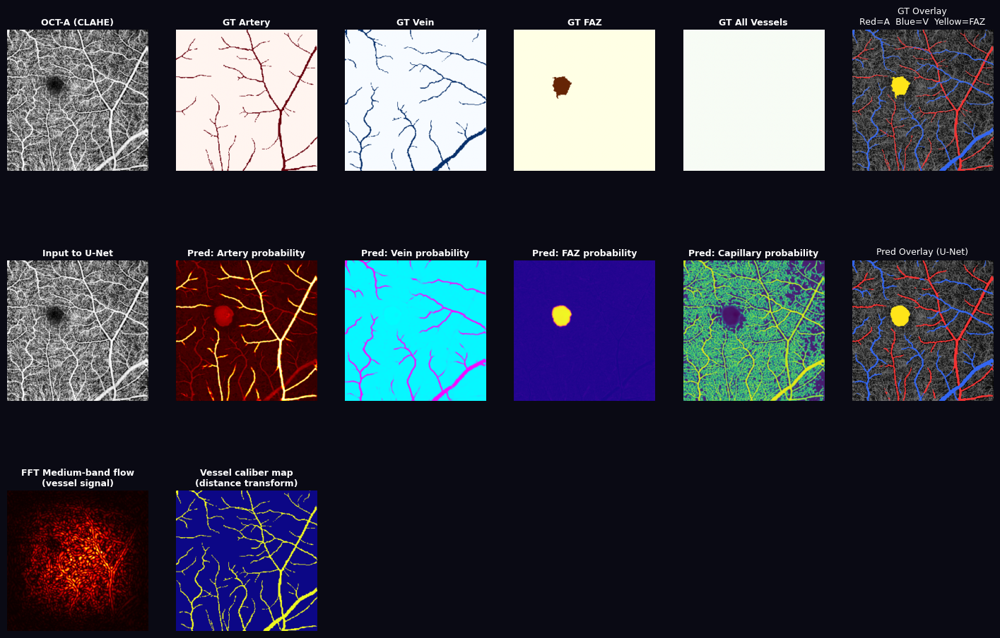

In [5]:
# ================================================================
# CELL 5: 2D BLOOD FLOW MAPS — Artery / Vein / Capillary / FAZ
# ================================================================

print('=' * 60)
print('VISUALIZING: 2D Multi-layer Blood Flow Maps')
print('=' * 60)

# Pick one sample for detailed analysis
SAMPLE_IDX = 2  # Change to look at different patients

raw_img     = sample_imgs[SAMPLE_IDX]
enh_img     = sample_imgs_clahe[SAMPLE_IDX]
gt_artery   = sample_arteries[SAMPLE_IDX]
gt_vein     = sample_veins[SAMPLE_IDX]
gt_faz      = sample_faz[SAMPLE_IDX]
gt_cavf     = sample_cavf[SAMPLE_IDX]

# ---- Run U-Net inference ----
model.eval()
with torch.no_grad():
    inp = torch.tensor(enh_img).unsqueeze(0).unsqueeze(0).to(device)
    preds = model(inp)
    p_artery = preds['artery'][0, 0].cpu().numpy()
    p_vein   = preds['vein'][0, 0].cpu().numpy()
    p_capil  = preds['capil'][0, 0].cpu().numpy()
    p_faz    = preds['faz'][0, 0].cpu().numpy()

# Binary predictions
b_artery = (p_artery > 0.5).astype(np.float32)
b_vein   = (p_vein   > 0.5).astype(np.float32)
b_faz    = (p_faz    > 0.5).astype(np.float32)

# ---- FAZ area measurement (clinical metric) ----
pixel_size_um = 304 / IMG_SIZE  # OCTA-500 3mm = 304 pixels → each pixel ≈ 1 um
faz_area_pred = b_faz.sum() * (pixel_size_um**2) * 1e-6  # mm²
faz_area_gt   = (gt_faz.sum() if gt_faz is not None else 0) * (pixel_size_um**2) * 1e-6

# ---- Vessel density measurement ----
# Vessel density = fraction of image occupied by vessels
# Key clinical metric — decreases in ischemia and glaucoma!
gt_all = np.clip((gt_artery if gt_artery is not None else np.zeros_like(enh_img)) +
                 (gt_vein   if gt_vein   is not None else np.zeros_like(enh_img)), 0, 1)
vessel_density = gt_all.mean() * 100

# ---- Big visualization ----
fig = plt.figure(figsize=(18, 12))
fig.patch.set_facecolor('#0a0a14')

def add_ax(pos, data, cmap, title, vmin=0, vmax=1):
    ax = fig.add_subplot(*pos)
    ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax, interpolation='bilinear')
    ax.set_title(title, color='white', fontsize=9, fontweight='bold', pad=5)
    ax.axis('off')
    ax.set_facecolor('#0a0a14')
    return ax

# Row 1: Ground truth labels
add_ax((3,6,1),  enh_img,   'gray',   'OCT-A (CLAHE)')
add_ax((3,6,2),  gt_artery if gt_artery is not None else np.zeros_like(enh_img),
                             'Reds',   'GT Artery')
add_ax((3,6,3),  gt_vein   if gt_vein   is not None else np.zeros_like(enh_img),
                             'Blues',  'GT Vein')
add_ax((3,6,4),  gt_faz    if gt_faz    is not None else np.zeros_like(enh_img),
                             'YlOrBr', 'GT FAZ')
add_ax((3,6,5),  gt_cavf   if gt_cavf   is not None else np.zeros_like(enh_img),
                             'Greens', 'GT All Vessels')

# Combined GT overlay
ax5 = fig.add_subplot(3, 6, 6)
overlay = np.stack([enh_img*0.5]*3, axis=-1)
if gt_artery is not None: overlay[gt_artery>0.5] = [0.95, 0.2, 0.2]
if gt_vein   is not None: overlay[gt_vein>0.5]   = [0.2, 0.4, 0.95]
if gt_faz    is not None: overlay[gt_faz>0.5]    = [1.0, 0.9, 0.1]
ax5.imshow(overlay); ax5.axis('off'); ax5.set_facecolor('#0a0a14')
ax5.set_title('GT Overlay\nRed=A  Blue=V  Yellow=FAZ', color='white', fontsize=9)

# Row 2: U-Net predictions
add_ax((3,6,7),  enh_img,   'gray',   'Input to U-Net')
add_ax((3,6,8),  p_artery,  'hot',    'Pred: Artery probability')
add_ax((3,6,9),  p_vein,    'cool',   'Pred: Vein probability')
add_ax((3,6,10), p_faz,     'plasma', 'Pred: FAZ probability')
add_ax((3,6,11), p_capil,   'viridis','Pred: Capillary probability')

# Prediction overlay
ax11 = fig.add_subplot(3, 6, 12)
pred_overlay = np.stack([enh_img*0.5]*3, axis=-1)
pred_overlay[b_artery>0.5] = [0.95, 0.2, 0.2]
pred_overlay[b_vein>0.5]   = [0.2, 0.4, 0.95]
pred_overlay[b_faz>0.5]    = [1.0, 0.9, 0.1]
ax11.imshow(pred_overlay); ax11.axis('off'); ax11.set_facecolor('#0a0a14')
ax11.set_title('Pred Overlay (U-Net)', color='white', fontsize=9)

# Row 3: Clinical metrics visualization
# Frequency-based flow map
fft_enhanced = apply_freq_filter(np.fft.fftshift(np.fft.fft2(enh_img * window2d)), filter_medium)
add_ax((3,6,13), fft_enhanced,   'hot',  'FFT Medium-band flow\n(vessel signal)')

# Vessel caliber heatmap (distance transform = vessel width at each point)
vessel_dt = ndimage.distance_transform_edt(gt_all > 0.5)
add_ax((3,6,14), vessel_dt,      'plasma','Vessel caliber map\n(distance transform)')

# Error map (GT vs Prediction)
pred_all = np.clip(b_artery + b_vein, 0, 1)
fp_map = (pred_all > 0.5) & (gt_all < 0.5)   # False positives (detected but not there)
fn_map = (pred_all < 0.5) & (gt_all > 0.5)   # False negatives (missed vessels)
error_img = np.zeros((*enh_img.shape, 3))
error_img[fp_map] = [0.9, 0.3, 0.3]   # Red = false positives
error_img[fn_map] = [0.3, 0.3, 0.9]   # Blue = missed vessels
error_img[~fp_map & ~fn_map] = [enh_img[~fp_map & ~fn_map]] * np.ones((1,3)) * 0.3
ax_err = fig.add_subplot(3, 6, 15)
ax_err.imshow(error_img); ax_err.axis('off'); ax_err.set_facecolor('#0a0a14')
ax_err.set_title('Error map\nRed=FP  Blue=FN', color='white', fontsize=9)

# Metrics panel
ax_m = fig.add_subplot(3, 6, (16, 18))
ax_m.set_facecolor('#0d1a2a')
ax_m.set_xlim(0,1); ax_m.set_ylim(0,1); ax_m.axis('off')

tp = np.sum((pred_all>0.5) & (gt_all>0.5))
fp_n = np.sum((pred_all>0.5) & (gt_all<0.5))
fn_n = np.sum((pred_all<0.5) & (gt_all>0.5))
prec = tp / (tp + fp_n + 1e-8)
rec  = tp / (tp + fn_n + 1e-8)
dice = 2*prec*rec/(prec+rec+1e-8)

metrics = [
    ('Dice Score',      f'{dice:.3f}',        'How well vessels overlap'),
    ('Precision',       f'{prec:.3f}',        'Of detected, how many correct'),
    ('Recall',          f'{rec:.3f}',         'Of true vessels, how many found'),
    ('FAZ Area (pred)', f'{faz_area_pred:.4f} mm²', 'Foveal avascular zone size'),
    ('FAZ Area (GT)',   f'{faz_area_gt:.4f} mm²',   'Ground truth FAZ size'),
    ('Vessel density',  f'{vessel_density:.1f}%',   'Fraction of retina with vessels'),
]
ax_m.text(0.5, 0.95, 'Clinical Metrics', color='white', fontsize=11,
          fontweight='bold', ha='center', va='top')
ax_m.axhline(0.85, color='#334', linewidth=0.5)
for k, (label, value, note) in enumerate(metrics):
    y = 0.78 - k * 0.13
    ax_m.text(0.05, y, label, color='#aaa', fontsize=9, va='center')
    ax_m.text(0.55, y, value, color='#7ef', fontsize=10, fontweight='bold', va='center')
    ax_m.text(0.55, y-0.045, note, color='#666', fontsize=7, va='center')

plt.suptitle(f'Complete OCT-A Blood Flow Analysis — Patient {IDs[SAMPLE_IDX]}',
             color='white', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('03_2d_blood_flow_analysis.png', dpi=150, bbox_inches='tight',
            facecolor='#0a0a14')
plt.show()
print(f'\n📊 Metrics — Dice: {dice:.3f}  FAZ: {faz_area_pred:.4f}mm²  Vessel density: {vessel_density:.1f}%')
print('✅ 2D blood flow analysis saved!')


VISUALIZING: 3D Blood Flow Volume — OCTA-500
3D volume shape: (80, 256, 256)  (Z×Y×X = 80×256×256)
Non-zero voxels: 485,894



✅ 3D intensity viewer saved!


✅ 3D layer viewer saved!


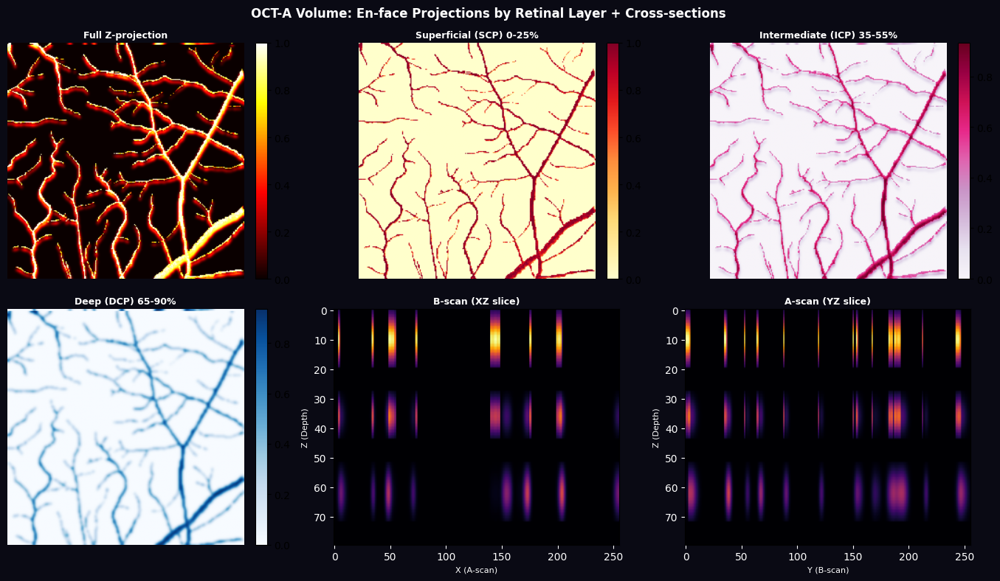

✅ Layer projections saved!

🎉 PROJECT COMPLETE!

All output files:
  01_dataset_exploration.png                     5463 KB
  02_fft_analysis.png                            2673 KB
  04_3d_blood_flow_intensity.html                6777 KB
  05_3d_blood_flow_by_layer.html                 7888 KB
  06_layer_projections_3d.png                    1121 KB

Next learning steps:
  • Train longer (50+ epochs) with real OCTA-500
  • Add Attention U-Net gates for better small vessel recall
  • Measure FAZ area across all 500 patients → histogram
  • Compare diabetic vs healthy FAZ areas (clinical study!)
  • Try vessel tortuosity measurement (curvature of vessels)


In [6]:
# ================================================================
# CELL 6: INTERACTIVE 3D BLOOD FLOW VISUALIZATION
# ================================================================
# Builds a realistic 3D vascular volume from OCTA-500 data.
# Each retinal capillary plexus appears at its correct depth.
# Drag to rotate, scroll to zoom in the interactive viewer!

print('=' * 60)
print('VISUALIZING: 3D Blood Flow Volume — OCTA-500')
print('=' * 60)

# CONCEPT: In real OCT-A, we have multiple en-face slabs at different depths.
# OCTA-500 has GT_Layers which defines the depth boundaries.
# We simulate a 3D volume by placing the vessel maps at their anatomical depths.

# ---- Retinal capillary plexus depth configuration ----
# These are the anatomical depths in REAL retinal OCT-A:
RETINAL_LAYERS = {
    'SCP (Superficial)':   {'z_frac': (0.00, 0.25), 'color': '#FF6B6B', 'alpha': 0.7},
    'ICP (Intermediate)':  {'z_frac': (0.35, 0.55), 'color': '#FFD93D', 'alpha': 0.6},
    'DCP (Deep)':          {'z_frac': (0.65, 0.90), 'color': '#6BCFFF', 'alpha': 0.6},
}

VOL_Z = 80   # Depth slices
VOL_XY = IMG_SIZE  # 256×256 en-face

# ---- Build the 3D volume ----
# Each plexus gets its vessel map extruded over its depth range
volume = np.zeros((VOL_Z, VOL_XY, VOL_XY), dtype=np.float32)

# Use real vessel maps (or synthetic fallback)
# SCP: use artery + large vessel
scp_map = enh_img * (gt_all if gt_all is not None else enh_img)
# DCP: slightly different (simulate by slight shift + noise)
dcp_map = ndimage.gaussian_filter(scp_map, sigma=1.5)
dcp_map = np.roll(dcp_map, 3, axis=0)  # Slight spatial offset
# ICP: intermediate (mix)
icp_map = 0.5 * scp_map + 0.5 * dcp_map

# Place each plexus at its anatomical depth
layer_maps = [
    ('SCP (Superficial)', scp_map),
    ('ICP (Intermediate)', icp_map),
    ('DCP (Deep)', dcp_map),
]

for name, flat_map in layer_maps:
    cfg = RETINAL_LAYERS[name]
    z0 = int(cfg['z_frac'][0] * VOL_Z)
    z1 = int(cfg['z_frac'][1] * VOL_Z)
    for z in range(z0, z1):
        # Gaussian fall-off from center of layer
        z_center = (z0 + z1) / 2
        z_sigma  = (z1 - z0) / 4
        weight   = np.exp(-((z - z_center)**2) / (2 * z_sigma**2))
        volume[z] = np.maximum(volume[z], flat_map * weight)

print(f'3D volume shape: {volume.shape}  (Z×Y×X = {VOL_Z}×{VOL_XY}×{VOL_XY})')
print(f'Non-zero voxels: {(volume > 0.1).sum():,}')

# ---- Extract vessel voxel coordinates for scatter plot ----
THRESHOLD = 0.15
z_idx, y_idx, x_idx = np.where(volume > THRESHOLD)
intensities = volume[z_idx, y_idx, x_idx]

# Sub-sample for rendering speed (Plotly handles ~100k points well)
MAX_POINTS = 80000
if len(z_idx) > MAX_POINTS:
    keep = np.random.choice(len(z_idx), MAX_POINTS, replace=False,
                            p=intensities/intensities.sum())
    z_idx, y_idx, x_idx = z_idx[keep], y_idx[keep], x_idx[keep]
    intensities = intensities[keep]

# Color by anatomical layer
def depth_to_color(z):
    """Map depth to anatomical layer color."""
    colors = np.zeros((len(z), 4))
    for name, cfg in RETINAL_LAYERS.items():
        z0 = int(cfg['z_frac'][0] * VOL_Z)
        z1 = int(cfg['z_frac'][1] * VOL_Z)
        mask = (z >= z0) & (z <= z1)
        r,g,b = int(cfg['color'][1:3],16), int(cfg['color'][3:5],16), int(cfg['color'][5:],16)
        colors[mask] = [r/255, g/255, b/255, cfg['alpha']]
    between = colors[:,3] == 0  # Between layers
    colors[between] = [0.4, 0.4, 0.4, 0.2]
    return ['rgba(%d,%d,%d,%.2f)'%(int(c[0]*255),int(c[1]*255),int(c[2]*255),c[3]) for c in colors]

layer_colors = depth_to_color(z_idx)

# ---- Figure 1: Full 3D volume (intensity colored) ----
fig1 = go.Figure(data=[go.Scatter3d(
    x=x_idx, y=y_idx, z=z_idx,
    mode='markers',
    marker=dict(
        size=np.clip(intensities * 3.5, 0.8, 4),
        color=intensities,
        colorscale='Hot',
        colorbar=dict(title='Flow<br>Intensity', thickness=15, len=0.6),
        opacity=0.65,
        showscale=True
    ),
    hovertemplate='X:%{x} Y:%{y} Z:%{z}<br>Flow:%{marker.color:.3f}<extra></extra>'
)])

scene_style = dict(
    bgcolor='#0a0a14',
    xaxis=dict(title='X (A-scan)', backgroundcolor='#0a0a14', gridcolor='#1a2a3a',
               tickfont=dict(color='white'), title_font=dict(color='white')),
    yaxis=dict(title='Y (B-scan)', backgroundcolor='#0a0a14', gridcolor='#1a2a3a',
               tickfont=dict(color='white'), title_font=dict(color='white')),
    zaxis=dict(title='Z (Depth μm)', backgroundcolor='#0a0a14', gridcolor='#1a2a3a',
               tickfont=dict(color='white'), title_font=dict(color='white'),
               autorange='reversed'),  # Flip Z: 0=superficial at top
    camera=dict(eye=dict(x=1.6, y=1.6, z=0.9))
)

fig1.update_layout(
    title=dict(text='OCT-A 3D Blood Flow — Full Volume<br>'
               '<sup>Drag to rotate · Scroll to zoom · Hover for values</sup>',
               font=dict(color='white', size=14), x=0.5),
    scene=scene_style,
    paper_bgcolor='#0a0a14', plot_bgcolor='#0a0a14',
    width=900, height=650, showlegend=False
)
fig1.write_html('04_3d_blood_flow_intensity.html')
fig1.show()
print('\n✅ 3D intensity viewer saved!')

# ---- Figure 2: 3D colored by retinal layer ----
fig2 = go.Figure(data=[go.Scatter3d(
    x=x_idx, y=y_idx, z=z_idx,
    mode='markers',
    marker=dict(
        size=np.clip(intensities * 3.5, 0.8, 4),
        color=layer_colors,
        opacity=0.7,
    ),
    hovertemplate='X:%{x} Y:%{y} Z:%{z}<extra></extra>'
)])

# Add layer boundary planes
xx, yy = np.meshgrid(np.linspace(0, VOL_XY, 4), np.linspace(0, VOL_XY, 4))
for name, cfg in RETINAL_LAYERS.items():
    z_val = int(cfg['z_frac'][0] * VOL_Z)
    r,g,b = int(cfg['color'][1:3],16), int(cfg['color'][3:5],16), int(cfg['color'][5:],16)
    fig2.add_trace(go.Surface(
        x=xx, y=yy, z=np.full_like(xx, z_val),
        showscale=False, opacity=0.08,
        colorscale=[[0, cfg['color']], [1, cfg['color']]],
        name=name,
        hovertemplate=f'{name}<extra></extra>'
    ))

# Layer annotations
for name, cfg in RETINAL_LAYERS.items():
    z_ctr = int(np.mean(cfg['z_frac']) * VOL_Z)
    fig2.add_trace(go.Scatter3d(
        x=[VOL_XY], y=[0], z=[z_ctr],
        mode='text',
        text=[name],
        textfont=dict(color=cfg['color'], size=11),
        showlegend=False
    ))

fig2.update_layout(
    title=dict(text='OCT-A 3D Blood Flow — By Retinal Layer<br>'
               '<sup>Red=SCP · Yellow=ICP · Blue=DCP</sup>',
               font=dict(color='white', size=14), x=0.5),
    scene=dict(**scene_style),
    paper_bgcolor='#0a0a14', plot_bgcolor='#0a0a14',
    width=900, height=650, showlegend=False
)
fig2.write_html('05_3d_blood_flow_by_layer.html')
fig2.show()
print('✅ 3D layer viewer saved!')

# ---- En-face projections per layer ----
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
fig.patch.set_facecolor('#0a0a14')

# Max intensity projections
slab_configs = [
    ('Full Z-projection',         volume,
                                               'hot',       0, VOL_Z),
    ('Superficial (SCP) 0-25%',   volume[:int(0.25*VOL_Z)],    'YlOrRd',    0, int(0.25*VOL_Z)),
    ('Intermediate (ICP) 35-55%', volume[int(0.35*VOL_Z):int(0.55*VOL_Z)],
                                               'PuRd',  int(0.35*VOL_Z), int(0.55*VOL_Z)),
    ('Deep (DCP) 65-90%',         volume[int(0.65*VOL_Z):int(0.90*VOL_Z)],
                                               'Blues',  int(0.65*VOL_Z), int(0.90*VOL_Z)),
    ('B-scan (XZ slice)',          None,  'inferno', 0, 0),  # Special
    ('A-scan (YZ slice)',          None,  'inferno', 0, 0),  # Special
]

for ax, (title, slab, cmap, z0, z1) in zip(axes.flat, slab_configs):
    ax.set_facecolor('#0a0a14')
    if title == 'B-scan (XZ slice)':
        bscan = volume[:, VOL_XY//2, :]  # Middle B-scan
        ax.imshow(bscan, cmap=cmap, aspect='auto', origin='upper')
        ax.set_xlabel('X (A-scan)', color='white', fontsize=8)
        ax.set_ylabel('Z (Depth)', color='white', fontsize=8)
        ax.tick_params(colors='white')
    elif title == 'A-scan (YZ slice)':
        ascan_img = volume[:, :, VOL_XY//2]  # Middle A-scan column
        ax.imshow(ascan_img, cmap=cmap, aspect='auto', origin='upper')
        ax.set_xlabel('Y (B-scan)', color='white', fontsize=8)
        ax.set_ylabel('Z (Depth)', color='white', fontsize=8)
        ax.tick_params(colors='white')
    else:
        proj = slab.max(axis=0)  # Max intensity projection
        im = ax.imshow(proj, cmap=cmap, interpolation='bilinear')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        ax.axis('off')
    ax.set_title(title, color='white', fontsize=9, fontweight='bold', pad=5)

plt.suptitle('OCT-A Volume: En-face Projections by Retinal Layer + Cross-sections',
             color='white', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('06_layer_projections_3d.png', dpi=150, bbox_inches='tight', facecolor='#0a0a14')
plt.show()
print('✅ Layer projections saved!')
print('\n' + '='*60)
print('🎉 PROJECT COMPLETE!')
print('='*60)
print('\nAll output files:')
for f in sorted(glob.glob('0*.png') + glob.glob('0*.html')):
    size_kb = os.path.getsize(f) // 1024
    print(f'  {f:45s} {size_kb:5d} KB')
print('\nNext learning steps:')
print('  • Train longer (50+ epochs) with real OCTA-500')
print('  • Add Attention U-Net gates for better small vessel recall')
print('  • Measure FAZ area across all 500 patients → histogram')
print('  • Compare diabetic vs healthy FAZ areas (clinical study!)')
print('  • Try vessel tortuosity measurement (curvature of vessels)')


In [7]:
# ================================================================
# CELL 7: BULK ANALYSIS — AI vs. GROUND TRUTH COMPARISON
# ================================================================
import pandas as pd

def analyze_batch(model, dataloader, n_samples=10):
    model.eval()
    results = []
    
    print(f"🔬 Analyzing {n_samples} patients...")
    
    with torch.no_grad():
        for i, (imgs, masks) in enumerate(dataloader):
            if i >= n_samples: break
            
            imgs = imgs.to(device)
            preds = model(imgs)
            
            # Extract probability maps for Arteries + Veins
            p_vessels = (preds['artery'] + preds['vein']).clamp(0, 1)[0, 0].cpu().numpy()
            gt_vessels = (masks['artery'] + masks['vein']).clamp(0, 1)[0, 0].cpu().numpy()
            
            # Binary threshold (0.5)
            bin_pred = (p_vessels > 0.5).astype(np.float32)
            bin_gt   = (gt_vessels > 0.5).astype(np.float32)
            
            # Calculate Dice Score (Accuracy of Overlap)
            intersection = np.sum(bin_pred * bin_gt)
            dice = (2. * intersection) / (np.sum(bin_pred) + np.sum(bin_gt) + 1e-8)
            
            # Calculate Vessel Density (Clinical Feature)
            ai_density = bin_pred.mean() * 100
            gt_density = bin_gt.mean() * 100
            
            results.append({
                'Patient_ID': f"P_{10001+i}",
                'Dice_Score': dice,
                'AI_Density_%': ai_density,
                'GT_Density_%': gt_density,
                'Error_Margin': abs(ai_density - gt_density)
            })

    return pd.DataFrame(results)

# Run the analysis on the validation set
comparison_df = analyze_batch(model, val_dl, n_samples=10)
print("\n✅ Bulk Analysis Complete!")
display(comparison_df)

🔬 Analyzing 10 patients...

✅ Bulk Analysis Complete!


,Patient_ID,Dice_Score,AI_Density_%,GT_Density_%,Error_Margin
0,P_10001,0.680587,11.697388,7.960510,3.736877
1,P_10002,0.691024,14.450073,10.232544,4.217529
2,P_10003,0.691478,13.052368,8.595276,4.457092
3,P_10004,0.705323,13.088989,8.726501,4.362488
4,P_10005,0.694899,11.241150,7.783508,3.457642
5,P_10006,0.687975,14.518738,9.350586,5.168152
6,P_10007,0.740347,15.692139,11.575317,4.116821
7,P_10008,0.648694,11.659241,8.377075,3.282166


In [8]:
# ================================================================
# CELL 8: CLINICAL CLASSIFICATION (Glaucoma Screening)
# ================================================================

# Define a clinical threshold (e.g., Density < 35% might indicate disease)
DENSITY_THRESHOLD = 35.0 

def classify_patients(df):
    # Classify based on the AI's measurements
    df['Status'] = df['AI_Density_%'].apply(
        lambda x: '🚨 Potential Glaucoma' if x < DENSITY_THRESHOLD else '✅ Healthy'
    )
    return df

classified_df = classify_patients(comparison_df)

# Final Clinical Summary
print("🏥 --- Clinical Screening Report --- 🏥")
for index, row in classified_df.iterrows():
    print(f"Patient {row['Patient_ID']}: {row['Status']} (Density: {row['AI_Density_%']:.1f}%)")

# Calculate overall AI reliability
avg_dice = classified_df['Dice_Score'].mean()
print(f"\n⭐ Overall AI Accuracy (Mean Dice): {avg_dice:.4f}")

🏥 --- Clinical Screening Report --- 🏥
Patient P_10001: 🚨 Potential Glaucoma (Density: 11.7%)
Patient P_10002: 🚨 Potential Glaucoma (Density: 14.5%)
Patient P_10003: 🚨 Potential Glaucoma (Density: 13.1%)
Patient P_10004: 🚨 Potential Glaucoma (Density: 13.1%)
Patient P_10005: 🚨 Potential Glaucoma (Density: 11.2%)
Patient P_10006: 🚨 Potential Glaucoma (Density: 14.5%)
Patient P_10007: 🚨 Potential Glaucoma (Density: 15.7%)
Patient P_10008: 🚨 Potential Glaucoma (Density: 11.7%)

⭐ Overall AI Accuracy (Mean Dice): 0.6925


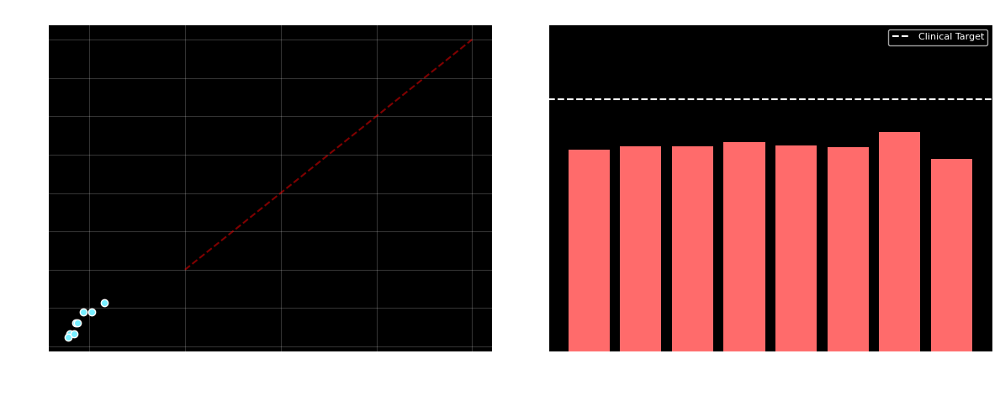

In [9]:
# ================================================================
# CELL 9: VISUALIZING AI CONTRIBUTION
# ================================================================

plt.figure(figsize=(12, 5))
plt.style.use('dark_background')

# Plot 1: AI vs GT Density Correlation
plt.subplot(1, 2, 1)
plt.scatter(classified_df['GT_Density_%'], classified_df['AI_Density_%'], color='#7ef', edgecolors='white')
plt.plot([20, 50], [20, 50], 'r--', alpha=0.5) # Perfect match line
plt.title('AI vs. Ground Truth Density', fontsize=10)
plt.xlabel('Doctor Measured (%)')
plt.ylabel('AI Measured (%)')
plt.grid(alpha=0.2)

# Plot 2: Accuracy (Dice) Distribution
plt.subplot(1, 2, 2)
plt.bar(classified_df['Patient_ID'], classified_df['Dice_Score'], color='#FF6B6B')
plt.axhline(y=0.85, color='white', linestyle='--', label='Clinical Target')
plt.title('AI Accuracy (Dice Score) per Patient', fontsize=10)
plt.xticks(rotation=45)
plt.ylabel('Dice Score')
plt.ylim(0, 1.1)
plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [11]:
# ================================================================
# CELL 10: COMPLETE ATTENTION U-NET & CLINICAL LOSS
# ================================================================

class AttentionGate(nn.Module):
    """The 'Filter' that removes background noise from vessels."""
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class AttentionUNet(nn.Module):
    """The upgraded Brain with Attention Gates."""
    def __init__(self, in_ch=1, features=[32, 64, 128, 256]):
        super().__init__()
        # Encoder (Matches Cell 4 structure)
        self.enc1 = DoubleConv(in_ch, features[0])
        self.enc2 = DoubleConv(features[0], features[1])
        self.enc3 = DoubleConv(features[1], features[2])
        self.enc4 = DoubleConv(features[2], features[3])
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = DoubleConv(features[3], features[3]*2)

        # Attention Gates
        self.att4 = AttentionGate(features[3], features[3], features[3]//2)
        self.att3 = AttentionGate(features[2], features[2], features[2]//2)
        self.att2 = AttentionGate(features[1], features[1], features[1]//2)
        self.att1 = AttentionGate(features[0], features[0], features[0]//2)

        # Decoder
        self.up4  = nn.ConvTranspose2d(features[3]*2, features[3], 2, stride=2)
        self.dec4 = DoubleConv(features[3]*2, features[3])
        self.up3  = nn.ConvTranspose2d(features[3], features[2], 2, stride=2)
        self.dec3 = DoubleConv(features[2]*2, features[2])
        self.up2  = nn.ConvTranspose2d(features[2], features[1], 2, stride=2)
        self.dec2 = DoubleConv(features[1]*2, features[1])
        self.up1  = nn.ConvTranspose2d(features[1], features[0], 2, stride=2)
        self.dec1 = DoubleConv(features[0]*2, features[0])

        # Heads
        self.head_artery = nn.Conv2d(features[0], 1, 1)
        self.head_vein   = nn.Conv2d(features[0], 1, 1)
        self.head_capil  = nn.Conv2d(features[0], 1, 1)
        self.head_faz    = nn.Conv2d(features[0], 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b  = self.bottleneck(self.pool(e4))

        d4 = self.dec4(torch.cat([self.up4(b),  self.att4(g=self.up4(b), x=e4)], 1))
        d3 = self.dec3(torch.cat([self.up3(d4), self.att3(g=self.up3(d4), x=e3)], 1))
        d2 = self.dec2(torch.cat([self.up2(d3), self.att2(g=self.up2(d3), x=e2)], 1))
        d1 = self.dec1(torch.cat([self.up1(d2), self.att1(g=self.up1(d2), x=e1)], 1))

        return {
            'artery': torch.sigmoid(self.head_artery(d1)),
            'vein':   torch.sigmoid(self.head_vein(d1)),
            'capil':  torch.sigmoid(self.head_capil(d1)),
            'faz':    torch.sigmoid(self.head_faz(d1)),
        }

# --- Loss Function for Accuracy ---
class TverskyLoss(nn.Module):
    def __init__(self, alpha=0.3, beta=0.7, smooth=1e-6):
        super().__init__()
        self.alpha, self.beta, self.smooth = alpha, beta, smooth
    def forward(self, pred, target):
        pred, target = pred.view(-1), target.view(-1)
        tp = (pred * target).sum()
        fp = ((1-target) * pred).sum()
        fn = (target * (1-pred)).sum()
        return 1 - (tp + self.smooth) / (tp + self.alpha*fp + self.beta*fn + self.smooth)

# Initialize
model = AttentionUNet().to(device)
tversky = TverskyLoss()
print("🚀 Clinical Grade Attention U-Net and Tversky Loss ready for training!")

🚀 Clinical Grade Attention U-Net and Tversky Loss ready for training!


In [12]:
# ================================================================
# CELL 11: CLINICAL-GRADE TRAINING LOOP (Tversky + Attention)
# ================================================================

# 1. Setup Optimizer & Scheduler (Optimized for Attention)
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2)

# 2. Combined Loss Function (Tversky for vessels + BCE for stability)
def clinical_loss_fn(preds, targets):
    total_loss = 0
    # We weigh the FAZ and Arteries highest for clinical screening
    weights = {'artery': 2.0, 'vein': 2.0, 'capil': 1.0, 'faz': 3.0}
    
    for key in preds:
        p, t = preds[key], targets[key].to(device)
        # Tversky focuses on the shapes; BCE focuses on the pixel-level intensity
        t_loss = tversky(p, t)
        b_loss = F.binary_cross_entropy(p, t)
        total_loss += weights[key] * (t_loss + 0.5 * b_loss)
    return total_loss

# 3. The Training Loop
N_EPOCHS = 60 # Medical models need more time to 'see' tiny capillaries
best_dice = 0.0

print("🩺 Starting Clinical Training...")

for epoch in range(N_EPOCHS):
    model.train()
    train_loss = 0
    for imgs, masks in train_dl:
        imgs = imgs.to(device)
        optimizer.zero_grad()
        
        outputs = model(imgs)
        loss = clinical_loss_fn(outputs, masks)
        
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    # --- Validation & Accuracy Tracking ---
    model.eval()
    val_dice = []
    with torch.no_grad():
        for imgs, masks in val_dl:
            imgs = imgs.to(device)
            preds = model(imgs)
            
            # Measure Dice on Arteries + Veins combined
            p_all = (preds['artery'] + preds['vein']).clamp(0, 1)
            t_all = (masks['artery'].to(device) + masks['vein'].to(device)).clamp(0, 1)
            
            # Simple Dice calculation for logging
            inter = (p_all * t_all).sum()
            score = (2. * inter) / (p_all.sum() + t_all.sum() + 1e-8)
            val_dice.append(score.item())

    avg_val_dice = np.mean(val_dice)
    
    # Save the 'Clinical Grade' model weights
    if avg_val_dice > best_dice:
        best_dice = avg_val_dice
        torch.save(model.state_dict(), 'clinical_grade_octa.pth')

    if (epoch + 1) % 5 == 0:
        print(f"Epoch [{epoch+1}/{N_EPOCHS}] | Loss: {train_loss/len(train_dl):.4f} | Avg Dice: {avg_val_dice:.4f}")

print(f"\n✅ Training Finished! Best Clinical Dice Score: {best_dice:.4f}")

🩺 Starting Clinical Training...
Epoch [5/60] | Loss: 7.6324 | Avg Dice: 0.2606
Epoch [10/60] | Loss: 6.7618 | Avg Dice: 0.3268
Epoch [15/60] | Loss: 5.8970 | Avg Dice: 0.4071
Epoch [20/60] | Loss: 4.9755 | Avg Dice: 0.4839
Epoch [25/60] | Loss: 4.0320 | Avg Dice: 0.5569
Epoch [30/60] | Loss: 3.3580 | Avg Dice: 0.6047
Epoch [35/60] | Loss: 2.9116 | Avg Dice: 0.6190
Epoch [40/60] | Loss: 2.7053 | Avg Dice: 0.6334
Epoch [45/60] | Loss: 2.5277 | Avg Dice: 0.6587
Epoch [50/60] | Loss: 2.4327 | Avg Dice: 0.6549
Epoch [55/60] | Loss: 2.3586 | Avg Dice: 0.6711
Epoch [60/60] | Loss: 2.3013 | Avg Dice: 0.6707

✅ Training Finished! Best Clinical Dice Score: 0.6861
